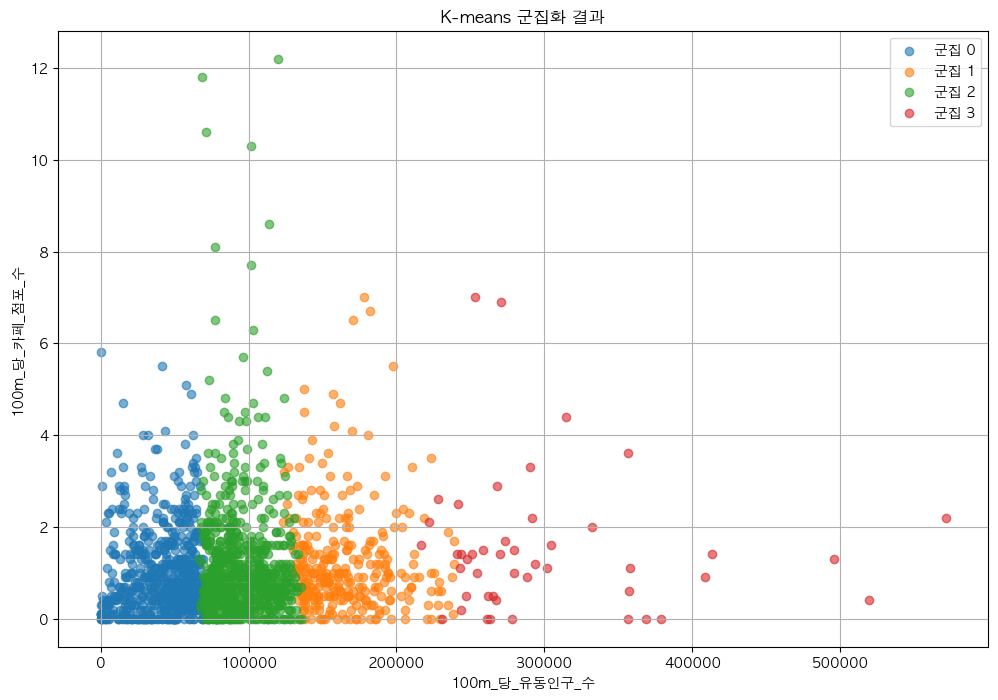

In [3]:
# 데이터 불러오기
import pandas as pd

merged = pd.read_csv('~/sang_2023_nn_de_10.csv') # 맥, 윈도우 경로 주의 # 전처리 csv 파일은 'cp949' 인코딩 필요없음

########kmeans 돌리기
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder


# 군집후 이상치 제거
merged = merged[~merged['상권_코드_명'].isin(['충정로역 7번', '신흥시장','삼성동 시장(삼성동시장)'])]

# 2. K-means++ 군집화
k = 4
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)

# 군집화에 사용할 피처 선택
features = ['100m_당_카페_점포_수', '100m_당_프랜차이즈_점포_수', '전체 평균 임대료',
             '100m_당_상주인구_수', '100m_당_유동인구_수','100m_당_2030_유동인구_수','100m_당_집객시설_수','100m_당_직장인구_수']

# K-means 모델 학습
kmeans.fit(merged[features])

# 군집화 결과를 원본 데이터프레임에 추가
merged['군집'] = kmeans.labels_

#merged.head()

# 시각화 
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt

# 한글 폰트 설정
plt.rc('font', family='AppleGothic')  # 윈도우의 경우 'Malgun Gothic', 맥OS의 경우 'AppleGothic' 등

# 마이너스 폰트 설정
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호가 깨지는 것 방지

# 나머지 시각화 코드
plt.figure(figsize=(12, 8))

# 각 군집에 대해 다른 색상으로 점 표시
for i in range(k):
    cluster_data = merged[merged['군집'] == i]
    plt.scatter(cluster_data['100m_당_유동인구_수'], cluster_data['100m_당_카페_점포_수'], 
                label=f'군집 {i}', alpha=0.6)

plt.title('K-means 군집화 결과')
plt.xlabel('100m_당_유동인구_수')
plt.ylabel('100m_당_카페_점포_수')
plt.legend()
plt.grid()
plt.show() 

In [5]:
#### 군집별 상위 매출 상권 추출
pd.set_option('display.float_format', '{:.2f}'.format)  # 수치값 지수 표기 말고 전체 표기
group1 = merged.loc[merged['군집']==2, :].sort_values(by='점포_당_당월_매출_금액', ascending=False).head(10)
group2 = merged.loc[merged['군집']==3, :].sort_values(by='점포_당_당월_매출_금액', ascending=False).head(10)
group3 = merged.loc[merged['군집']==0, :].sort_values(by='점포_당_당월_매출_금액', ascending=False).head(10)
group4 = merged.loc[merged['군집']==1, :].sort_values(by='점포_당_당월_매출_금액', ascending=False).head(10)

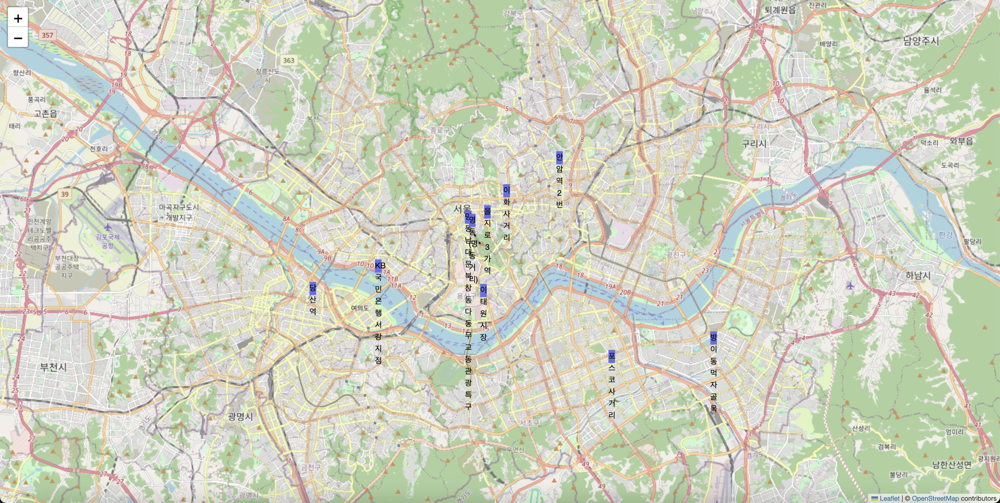

In [9]:
# pip install folium
# pip install pyproj
import pandas as pd
import folium
from pyproj import Transformer

# areas 데이터프레임 불러오기
areas = pd.read_csv('~/areas.csv', encoding='cp949')  # 맥, 윈도우 경로 주의

# group1과 areas를 상권_코드_명 기준으로 조인
merged_with_areas = pd.merge(group1, areas, on='상권_코드_명', how='left', suffixes=('', '_y'))

# 중복된 컬럼 제거 (suffixes로 만들어진 _y가 붙은 컬럼 제거)
merged_with_areas = merged_with_areas.loc[:, ~merged_with_areas.columns.str.endswith('_y')]

# 좌표 변환기 설정 (EPSG:5181 -> EPSG:4326)
transformer = Transformer.from_crs("epsg:5181", "epsg:4326", always_xy=True)

# 변환된 위도, 경도 추가
merged_with_areas[['경도', '위도']] = merged_with_areas[['엑스좌표_값', '와이좌표_값']].apply(
    lambda row: transformer.transform(row['엑스좌표_값'], row['와이좌표_값']),
    axis=1, result_type="expand"
)

# 지도 생성 (초기 위치는 평균 위도, 경도를 기준으로 설정)
m = folium.Map(location=[merged_with_areas['위도'].mean(), merged_with_areas['경도'].mean()], zoom_start=12)

# 색상을 결정하는 함수 정의 (군집에 따라 색상 지정)
def get_color(cluster):
    colors = {0: "#F9A352", 1: "#F15D49", 2: "#686FEA", 3: "#267853"}
    return colors.get(cluster, "gray")  # 기본값은 'gray'

# 특정 Cluster 값(예: 2)만 지도에 표시
for index, row in merged_with_areas.iterrows():
    if row['군집'] == 2:  # 해당 Cluster 값만 표시
        size = 10  # 마커 크기

        # Folium 마커 추가
        folium.map.Marker(
            location=[row['위도'], row['경도']],
            icon=folium.DivIcon(
                html=f'<div style="text-align: center; width: {size}px; height: {size + 10}px; background-color: {get_color(row["군집"])};">'
                     f'<div style="line-height: {size}px;"></div>'
                     f'<span style="font-size: 12px; color: black;">{row["상권_코드_명"]}</span>'
                     f'</div>'
            )
        ).add_to(m)

# 지도 표시
# m

from IPython.display import Image, display
image_path = "/Users/dgriii0606/map1.png"

# 이미지 출력
display(Image(filename=image_path))

In [168]:
import pandas as pd
import folium
from pyproj import Transformer

# areas 데이터프레임 불러오기
areas = pd.read_csv('~/areas.csv', encoding='cp949')  # 맥, 윈도우 경로 주의

# group1과 areas를 상권_코드_명 기준으로 조인
merged_with_areas = pd.merge(group2, areas, on='상권_코드_명', how='left', suffixes=('', '_y'))

# 중복된 컬럼 제거 (suffixes로 만들어진 _y가 붙은 컬럼 제거)
merged_with_areas = merged_with_areas.loc[:, ~merged_with_areas.columns.str.endswith('_y')]

# 좌표 변환기 설정 (EPSG:5181 -> EPSG:4326)
transformer = Transformer.from_crs("epsg:5181", "epsg:4326", always_xy=True)

# 변환된 위도, 경도 추가
merged_with_areas[['경도', '위도']] = merged_with_areas[['엑스좌표_값', '와이좌표_값']].apply(
    lambda row: transformer.transform(row['엑스좌표_값'], row['와이좌표_값']),
    axis=1, result_type="expand"
)

# 지도 생성 (초기 위치는 평균 위도, 경도를 기준으로 설정)
m = folium.Map(location=[merged_with_areas['위도'].mean(), merged_with_areas['경도'].mean()], zoom_start=12)

# 색상을 결정하는 함수 정의 (군집에 따라 색상 지정)
def get_color(cluster):
    colors = {0: "#F9A352", 1: "#F15D49", 2: "#686FEA", 3: "#267853"}
    return colors.get(cluster, "gray")  # 기본값은 'gray'

# 특정 Cluster 값(예: 2)만 지도에 표시
for index, row in merged_with_areas.iterrows():
    if row['군집'] == 3:  # 해당 Cluster 값만 표시
        size = 10  # 마커 크기

        # Folium 마커 추가
        folium.map.Marker(
            location=[row['위도'], row['경도']],
            icon=folium.DivIcon(
                html=f'<div style="text-align: center; width: {size}px; height: {size + 10}px; background-color: {get_color(row["군집"])};">'
                     f'<div style="line-height: {size}px;"></div>'
                     f'<span style="font-size: 12px; color: black;">{row["상권_코드_명"]}</span>'
                     f'</div>'
            )
        ).add_to(m)

# 지도 표시
m

In [170]:
import pandas as pd
import folium
from pyproj import Transformer

# areas 데이터프레임 불러오기
areas = pd.read_csv('~/areas.csv', encoding='cp949')  # 맥, 윈도우 경로 주의

# group1과 areas를 상권_코드_명 기준으로 조인
merged_with_areas = pd.merge(group3, areas, on='상권_코드_명', how='left', suffixes=('', '_y'))

# 중복된 컬럼 제거 (suffixes로 만들어진 _y가 붙은 컬럼 제거)
merged_with_areas = merged_with_areas.loc[:, ~merged_with_areas.columns.str.endswith('_y')]

# 좌표 변환기 설정 (EPSG:5181 -> EPSG:4326)
transformer = Transformer.from_crs("epsg:5181", "epsg:4326", always_xy=True)

# 변환된 위도, 경도 추가
merged_with_areas[['경도', '위도']] = merged_with_areas[['엑스좌표_값', '와이좌표_값']].apply(
    lambda row: transformer.transform(row['엑스좌표_값'], row['와이좌표_값']),
    axis=1, result_type="expand"
)

# 지도 생성 (초기 위치는 평균 위도, 경도를 기준으로 설정)
m = folium.Map(location=[merged_with_areas['위도'].mean(), merged_with_areas['경도'].mean()], zoom_start=12)

# 색상을 결정하는 함수 정의 (군집에 따라 색상 지정)
def get_color(cluster):
    colors = {0: "#F9A352", 1: "#F15D49", 2: "#686FEA", 3: "#267853"}
    return colors.get(cluster, "gray")  # 기본값은 'gray'

# 특정 Cluster 값(예: 2)만 지도에 표시
for index, row in merged_with_areas.iterrows():
    if row['군집'] == 0:  # 해당 Cluster 값만 표시
        size = 10  # 마커 크기

        # Folium 마커 추가
        folium.map.Marker(
            location=[row['위도'], row['경도']],
            icon=folium.DivIcon(
                html=f'<div style="text-align: center; width: {size}px; height: {size + 10}px; background-color: {get_color(row["군집"])};">'
                     f'<div style="line-height: {size}px;"></div>'
                     f'<span style="font-size: 12px; color: black;">{row["상권_코드_명"]}</span>'
                     f'</div>'
            )
        ).add_to(m)

# 지도 표시
m

In [178]:
import pandas as pd
import folium
from pyproj import Transformer

# areas 데이터프레임 불러오기
areas = pd.read_csv('~/areas.csv', encoding='cp949')  # 맥, 윈도우 경로 주의

# group1과 areas를 상권_코드_명 기준으로 조인
merged_with_areas = pd.merge(group4, areas, on='상권_코드_명', how='left', suffixes=('', '_y'))

# 중복된 컬럼 제거 (suffixes로 만들어진 _y가 붙은 컬럼 제거)
merged_with_areas = merged_with_areas.loc[:, ~merged_with_areas.columns.str.endswith('_y')]

# 좌표 변환기 설정 (EPSG:5181 -> EPSG:4326)
transformer = Transformer.from_crs("epsg:5181", "epsg:4326", always_xy=True)

# 변환된 위도, 경도 추가
merged_with_areas[['경도', '위도']] = merged_with_areas[['엑스좌표_값', '와이좌표_값']].apply(
    lambda row: transformer.transform(row['엑스좌표_값'], row['와이좌표_값']),
    axis=1, result_type="expand"
)

# 지도 생성 (초기 위치는 평균 위도, 경도를 기준으로 설정)
m = folium.Map(location=[merged_with_areas['위도'].mean(), merged_with_areas['경도'].mean()], zoom_start=12)

# 색상을 결정하는 함수 정의 (군집에 따라 색상 지정)
def get_color(cluster):
    colors = {0: "#F9A352", 1: "#F15D49", 2: "#686FEA", 3: "#267853"}
    return colors.get(cluster, "gray")  # 기본값은 'gray'

# 특정 Cluster 값(예: 2)만 지도에 표시
for index, row in merged_with_areas.iterrows():
    if row['군집'] == 1:  # 해당 Cluster 값만 표시
        size = 10  # 마커 크기

        # Folium 마커 추가
        folium.map.Marker(
            location=[row['위도'], row['경도']],
            icon=folium.DivIcon(
                html=f'<div style="text-align: center; width: {size}px; height: {size + 10}px; background-color: {get_color(row["군집"])};">'
                     f'<div style="line-height: {size}px;"></div>'
                     f'<span style="font-size: 12px; color: black;">{row["상권_코드_명"]}</span>'
                     f'</div>'
            )
        ).add_to(m)

# 지도 표시
m